# Analysis of the Datasets and Strategy for AI-Powered Renewable Energy Consumption & Forecasting Dashboard

# Objectives

- **Understand the Dataset:** Analyze the provided datasets to assess their structure, completeness, and relevance to the project goals.

- **Explore Renewable Energy Consumption Trends:** Identify historical patterns in renewable energy consumption at national, continental, and global levels.

- **Assess the Impact of Investments on Renewable Energy Growth:** Examine how public and private investments correlate with the increase in renewable energy production.

- **Evaluate Policy and Macroeconomic Influences:** Analyze how economic factors, government policies, and global trends impact renewable energy adoption.

- **Prepatre a aData set for Develop an AI-Powered Interactive Dashboard:** Create a cleaned dataset for a web-based visualization platform to display energy consumption trends, forecasts, and policy insights.

- **Ensure Data Consistency and Integrity:** Preprocess, clean, and integrate multiple datasets for accurate analysis and forecasting.

# Questions:

## Data Understanding & Preparation
- What are the key variables in each dataset, and how do they relate to renewable energy consumption and forecasting?

- Are there any missing values or inconsistencies that need to be addressed before analysis?

- How can different datasets be merged effectively for better insights and predictions?

## Trend Analysis & Forecasting
- What are the historical trends in renewable energy consumption for different countries and continents?

- How has the share of renewable energy changed over the past few decades?

- Which forecasting model (ARIMA, Prophet, LSTM) provides the most accurate predictions for future renewable energy adoption?

- What are the expected trends in renewable energy adoption for the next 5–10 years?

## Investment & Economic Impact
- How does public and private investment impact renewable energy production and adoption?

- Is there a correlation between GDP growth and increased renewable energy consumption?

- Which countries have successfully scaled their renewable energy infrastructure, and what investment patterns support this growth?

## Policy & Regulatory Factors
- What policies have been most effective in promoting renewable energy adoption?

- How do government incentives and regulations affect renewable energy trends?

- Are there any observable macroeconomic factors (e.g., inflation, energy prices) that influence renewable energy adoption?

## Visualization & Dashboard Development
- What types of visualizations (heatmaps, line charts, bar charts, dashboards) best represent energy consumption and forecasting insights?

- How can an interactive dashboard help policymakers, businesses, and researchers make data-driven decisions?

- What features should be included in the dashboard to allow users to explore data dynamically?

In [1]:
# the goal is the analyze the data and find the best way to predict the Strategy for AI-Powered Renewable Energy Consumption & Forecasting Dashboard
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


## Datasets Loading
### 1. Our World in Data (OWID) - Global Energy Dataset

In [2]:
# loading the datasets
# owid data
owid_data = pd.read_csv('data/OWID/owid-energy-data.csv')
owid_bookcode = pd.read_csv('data/OWID/owid-energy-codebook.csv')

print(
    owid_data.shape,
    owid_bookcode.shape,
)

(21812, 130) (130, 4)


In [3]:
owid_data.head()

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
0,ASEAN (Ember),2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
1,ASEAN (Ember),2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
2,ASEAN (Ember),2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
3,ASEAN (Ember),2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
4,ASEAN (Ember),2004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN


In [4]:
owid_data.sample(10)

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
14487,North Macedonia,2000,MKD,2037940.0,1.630799e+10,NaN,0.000,0.000,0.000,0.000,...,0.000,0.0,NaN,0.000,0.000,0.00,0.00,0.000,0.000,0.000
17669,South Africa,1970,ZAF,22368306.0,1.466270e+11,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12765,Mozambique,1966,MOZ,7689640.0,1.844939e+10,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16071,Philippines,1998,PHL,74491928.0,2.991055e+11,NaN,0.000,0.000,0.000,NaN,...,0.000,0.0,NaN,0.000,0.000,0.00,0.00,0.000,0.000,0.000
11928,Mexico,1943,MEX,21885841.0,6.292350e+10,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3340,Bulgaria,2012,BGR,7488347.0,1.102615e+11,399.988,0.781,130.387,0.976,9.348,...,1.679,1.0,41.784,0.972,3.348,162.92,1.22,447.044,2.626,1.569
1614,Australia,1944,AUS,7396847.0,8.577112e+10,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10327,Kenya,1985,KEN,19452160.0,3.169743e+10,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6322,Eritrea,2008,ERI,3005783.0,NaN,NaN,NaN,NaN,NaN,0.000,...,0.000,NaN,NaN,NaN,NaN,0.00,0.00,NaN,0.000,NaN
1937,Bahamas,2013,BHS,385660.0,NaN,NaN,NaN,NaN,NaN,0.000,...,0.000,NaN,NaN,NaN,NaN,0.00,0.00,NaN,0.000,NaN


### 2. Global Energy Consumption & Renewable Generation || Kaggle

In [5]:
# global energy data
continent_consumption = pd.read_csv("data/global_energy/Continent_Consumption_TWH.csv")
country_consumption = pd.read_csv("data/global_energy/Country_Consumption_TWH.csv")
non_renewable_total_power_generation = pd.read_csv(
    "data/global_energy/nonRenewablesTotalPowerGeneration.csv"
)
renewable_power_generation_97_17 = pd.read_csv(
    "data/global_energy/renewablePowerGeneration97-17.csv"
)
renewable_total_power_generation = pd.read_csv(
    "data/global_energy/renewablesTotalPowerGeneration.csv"
)
top_20_countries_power_generatoin = pd.read_csv(
    "data/global_energy/top20CountriesPowerGeneration.csv"
)

# print the shapes of the datasets
print(
    continent_consumption.shape,
    country_consumption.shape,
    non_renewable_total_power_generation.shape,
    renewable_power_generation_97_17.shape,
    renewable_total_power_generation.shape,
    top_20_countries_power_generatoin.shape,
)

(31, 12) (31, 45) (8, 2) (28, 5) (9, 2) (20, 6)


In [6]:
continent_consumption.head()

,Year,World,OECD,BRICS,Europe,North America,Latin America,Asia,Pacific,Africa,Middle-East,CIS
0,1990,101855.54,52602.49,26621.07,20654.88,24667.23,5373.06,24574.19,1197.89,4407.77,2581.86,16049.40
1,1991,102483.56,53207.25,26434.99,20631.62,24841.68,5500.99,24783.53,1186.26,4535.70,2744.68,15898.21
2,1992,102588.23,53788.75,25993.05,20189.68,25341.77,5628.92,25690.67,1209.52,4582.22,3081.95,14339.79
3,1993,103646.56,54614.48,26283.80,20189.68,25830.23,5675.44,26876.93,1267.67,4721.78,3349.44,13246.57
4,1994,104449.03,55579.77,25993.05,20085.01,26365.21,5989.45,28098.08,1279.30,4803.19,3640.19,11606.74


In [7]:
country_consumption.head()

,Year,China,United States,Brazil,Belgium,Czechia,France,Germany,Italy,Netherlands,...,Australia,New Zealand,Algeria,Egypt,Nigeria,South Africa,Iran,Kuwait,Saudi Arabia,United Arab Emirates
0,1990,874,1910,141,48,50,225,351,147,67,...,86,14,22,33,66,90,69,9,58,20
1,1991,848,1925,143,50,45,237,344,150,69,...,85,14,23,33,70,92,77,3,68,23
2,1992,877,1964,145,51,44,234,338,149,69,...,87,14,24,34,72,88,81,9,77,22
3,1993,929,1998,148,49,43,238,335,149,70,...,91,15,24,35,74,94,87,12,80,23
4,1994,973,2036,156,52,41,231,333,147,70,...,91,15,23,34,72,98,97,14,84,26


In [8]:
country_consumption.head()

,Year,China,United States,Brazil,Belgium,Czechia,France,Germany,Italy,Netherlands,...,Australia,New Zealand,Algeria,Egypt,Nigeria,South Africa,Iran,Kuwait,Saudi Arabia,United Arab Emirates
0,1990,874,1910,141,48,50,225,351,147,67,...,86,14,22,33,66,90,69,9,58,20
1,1991,848,1925,143,50,45,237,344,150,69,...,85,14,23,33,70,92,77,3,68,23
2,1992,877,1964,145,51,44,234,338,149,69,...,87,14,24,34,72,88,81,9,77,22
3,1993,929,1998,148,49,43,238,335,149,70,...,91,15,24,35,74,94,87,12,80,23
4,1994,973,2036,156,52,41,231,333,147,70,...,91,15,23,34,72,98,97,14,84,26


In [9]:
non_renewable_total_power_generation.head()

,Mode of Generation,Contribution (TWh)
0,Coal,9863.33
1,Natural Gas,5882.82
2,Nuclear,2636.03
3,Oil,841.87
4,Waste,114.04


In [10]:
renewable_power_generation_97_17.head()

,Year,Hydro(TWh),Biofuel(TWh),Solar PV (TWh),Geothermal (TWh)
0,1990,2191.67,3.88,0.09,36.42
1,1991,2268.63,4.19,0.10,37.39
2,1992,2267.16,4.63,0.12,39.30
3,1993,2397.67,5.61,0.15,40.23
4,1994,2419.73,7.31,0.17,41.05


In [11]:
renewable_total_power_generation.head()

,Mode of Generation,Contribution (TWh)
0,Hydro,9863.33
1,Wind,5882.82
2,Biofuel,2636.03
3,Solar PV,841.87
4,Geothermal,114.04


In [12]:
top_20_countries_power_generatoin.head()

,Country,Hydro(TWh),Biofuel(TWh),Solar PV (TWh),Geothermal (TWh),Total (TWh)
0,China,1189.84,295.02,79.43,0.125,1819.940
1,USA,315.62,277.91,58.95,18.960,758.619
2,Brazil,370.90,42.37,52.25,0.000,466.350
3,Canada,383.48,29.65,7.12,0.000,424.090
4,India,141.80,51.06,43.76,0.000,262.650


### Energy Generation & Consumption (from multiple sources)

In [13]:
electricity_consumption_statistics = pd.read_csv('data/IRR_cleaned/ELECSTAT_CLEANED.csv')
heat_generations = pd.read_csv('data/IRR_cleaned/HEATGEN_CLEANED.csv')
share_of_renewables = pd.read_csv('data/IRR_cleaned/RESHARE_CLEANED.csv')
investment_in_energy_infrastructure = pd.read_csv('data/IRR_cleaned/PUBFIN_CLEANED.csv')

print(
    electricity_consumption_statistics.shape,
    heat_generations.shape,
    share_of_renewables.shape,
    investment_in_energy_infrastructure.shape,
)

(9648, 7) (9254, 5) (10123, 4) (197064, 4)


In [14]:
electricity_consumption_statistics.head()

,Region_Tech_Desc,Category,Data_Type,Year,Electricity_Output_GWh,Grid_Connection,Miscellaneous
0,World,Total renewable,Electricity Generation (GWh),2000.0,2846212,NaN,NaN
1,World,Total renewable,Electricity Installed Capacity (MW),2000.0,752238.54,NaN,NaN
2,World,Solar energy,Electricity Generation (GWh),2000.0,1312.13,NaN,NaN
3,World,Solar energy,Electricity Installed Capacity (MW),2000.0,1215.68,NaN,NaN
4,World,Wind energy,Electricity Generation (GWh),2000.0,30944.47,NaN,NaN


In [15]:
heat_generations.head()

,Country/Area,Technology,Grid Connection,Year,Heat Generation (TJ)
0,Albania,Coal and peat,Heat (Commercial),2000,84.0
1,Albania,Coal and peat,Heat (Commercial),2001,109.0
2,Albania,Coal and peat,Heat (Commercial),2002,77.0
3,Albania,Oil,Combined Heat and Power (CHP),2000,145.0
4,Albania,Oil,Combined Heat and Power (CHP),2001,138.0


In [16]:
share_of_renewables.head()

,Region/Country,Indicator,Year,Value
0,World,RE share of electricity generation (%),2000,18.31
1,World,NaN,2001,17.82
2,World,NaN,2002,17.76
3,World,NaN,2003,17.29
4,World,NaN,2004,17.73


In [17]:
investment_in_energy_infrastructure.head()

,Country,Technology,Year,Investment
0,Afghanistan,On-grid Solar photovoltaic,2022,0.00
1,Afghanistan,On-grid Solar photovoltaic,2021,0.00
2,Afghanistan,On-grid Solar photovoltaic,2020,0.00
3,Afghanistan,On-grid Solar photovoltaic,2019,4.38
4,Afghanistan,On-grid Solar photovoltaic,2018,48.17


# 1. Understanding the Datasets

After reviewing the three provided datasets, we can categorize them as follows:


## 1. Dataset Group 1: Our World in Data (OWID) - Global Energy Dataset

**Section Summary:**
- **owid-energy-data.csv**: A dataset covering global energy production, electricity mix, and energy consumption trends from various sources (hydro, wind, solar, fossil fuels, etc.).

- **owid-energy-codebook.csv**: A codebook detailing column descriptions and data sources for the OWID dataset.

In [18]:
owid_data.columns

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'solar_share_elec', 'solar_share_energy', 'wind_cons_change_pct',
       'wind_cons_change_twh', 'wind_consumption', 'wind_elec_per_capita',
       'wind_electricity', 'wind_energy_per_capita', 'wind_share_elec',
       'wind_share_energy'],
      dtype='object', length=130)

In [19]:
owid_bookcode.columns

Index(['column', 'description', 'unit', 'source'], dtype='object')

In [20]:
# save the output on a text file
owid_data.describe().to_csv('outputs/exploring_outputs/owid/owid_data_describe.csv')
owid_data.describe()

,year,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
count,21812.000000,1.844700e+04,1.177500e+04,1806.000000,2796.000000,2400.000000,2876.000000,5570.000000,5834.000000,5811.000000,...,7183.000000,4127.000000,2508.000000,4740.000000,4845.000000,7278.000000,8234.000000,4153.000000,7197.000000,4193.000000
mean,1974.195718,1.054051e+08,4.260596e+11,45.489759,2.867027,136.600523,39.082519,66.750870,11.262839,1.865575,...,0.772870,0.258574,306.388427,7.886606,60.060250,67.711201,18.936078,254.848409,1.491997,0.717834
std,35.342860,4.665375e+08,3.508591e+12,266.131064,10.692769,261.757657,116.307666,197.542142,49.585627,5.372183,...,2.495118,0.773014,6297.500646,39.805408,306.013269,267.759489,110.680131,791.447343,4.688010,2.018520
min,1900.000000,1.833000e+03,1.642060e+08,-100.000000,-49.355000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-100.000000,-50.829000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1946.000000,1.714291e+06,1.438637e+10,-0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,3.921750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1984.000000,6.998022e+06,4.393385e+10,8.189000,0.000000,14.642500,0.694500,0.491000,0.010000,0.096000,...,0.000000,0.000000,19.564500,0.000000,0.008000,0.000000,0.000000,0.084000,0.000000,0.004000
75%,2004.000000,2.571993e+07,1.830838e+11,26.550000,0.832000,175.006500,12.811500,38.162750,0.720000,1.526500,...,0.138500,0.026000,46.448500,0.359250,2.782000,3.080750,0.150000,56.324000,0.419000,0.320000
max,2023.000000,8.045311e+09,1.301126e+14,5659.328000,144.146000,2588.512000,1317.625000,2453.043000,678.740000,77.586000,...,50.000000,9.368000,242384.844000,677.824000,6040.359000,3283.758000,2304.440000,8523.436000,57.716000,25.767000


The bookcode provides metadata about the cols, we can benefit from that by visually navigate through the csv. 

After Reviewing the bookcode CSV, I can benefit from the "column" and the "units" columns through my programatically exploring into this dataset.

In [21]:
owid_bookcode = owid_bookcode[['column', 'unit']]
owid_bookcode.dropna(inplace=True)
owid_bookcode.head()

,column,unit
3,population,persons
4,gdp,international-$ in 2011 prices
5,biofuel_cons_change_pct,%
6,biofuel_cons_change_twh,terawatt-hours
7,biofuel_cons_per_capita,kilowatt-hours


In [22]:
owid_info_df = pd.DataFrame(owid_data.dtypes, columns=['data_type']).reset_index()
owid_info_df.to_csv('outputs/exploring_outputs/owid/owid_info.csv')

# owid_info_df['missing_values'] = owid_data.isnull().sum()

In [23]:
owid_data.value_counts().to_csv('outputs/exploring_outputs/owid/owid_data_value_counts.csv')   

In [24]:
missing_df = owid_data.isnull().sum().reset_index()
missing_df.columns = ['column', 'missing_values']
missing_df['total_values'] = owid_data.shape[0]
missing_df['missing_percentage'] = missing_df['missing_values'] / missing_df['total_values'] * 100
missing_df.sort_values('missing_percentage', ascending=False, inplace=True)
missing_df.to_csv('outputs/exploring_outputs/owid/owid_data_missing.csv')

In [25]:
def basic_info(df, name):
    print(f"\n{name} Dataset Info:")
    print(df.info())
    print("\nMissing values:")
    print(df.isnull().sum())
    print("\nSummary Statistics:")
    print(df.describe(include='all'))

In [26]:
basic_info(owid_data, "Energy Data")


Energy Data Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21812 entries, 0 to 21811
Columns: 130 entries, country to wind_share_energy
dtypes: float64(127), int64(1), object(2)
memory usage: 21.6+ MB
None

Missing values:
country                       0
year                          0
iso_code                   5000
population                 3365
gdp                       10037
                          ...  
wind_elec_per_capita      14534
wind_electricity          13578
wind_energy_per_capita    17659
wind_share_elec           14615
wind_share_energy         17619
Length: 130, dtype: int64

Summary Statistics:
         country          year iso_code    population           gdp  \
count      21812  21812.000000    16812  1.844700e+04  1.177500e+04   
unique       294           NaN      220           NaN           NaN   
top     Zimbabwe           NaN      DZA           NaN           NaN   
freq         124           NaN      124           NaN           NaN   
mean 

In [27]:
# Step 1: Drop columns with more than 85% missing values
threshold = 85  # Percentage threshold for dropping columns
columns_to_drop = missing_df[missing_df["missing_percentage"] > threshold]["column"].tolist()
owid_data_cleaned = owid_data.drop(columns=columns_to_drop)

# Step 2: Fill missing values for population and GDP using interpolation
owid_data_cleaned["population"] = owid_data_cleaned["population"].interpolate(method="linear")
owid_data_cleaned["gdp"] = owid_data_cleaned["gdp"].interpolate(method="linear")

# Step 3: Convert data types where necessary
# Ensure 'year' is integer and 'population' & 'gdp' are floats
owid_data_cleaned["year"] = owid_data_cleaned["year"].astype(int)
owid_data_cleaned["population"] = owid_data_cleaned["population"].astype(float)
owid_data_cleaned["gdp"] = owid_data_cleaned["gdp"].astype(float)

# Step 4: Remove non-country entities (if needed)
# Checking unique values in the 'country' column
unique_countries = owid_data_cleaned["country"].unique()

# Removing entities that do not represent countries (assumed they contain parentheses)
owid_data_cleaned = owid_data_cleaned[~owid_data_cleaned["country"].str.contains(r"\(|\)", regex=True)]

# Save cleaned dataset for further analysis
cleaned_data_path = "/mnt/data/owid-energy-data-cleaned.csv"
owid_data_cleaned.to_csv(cleaned_data_path, index=False)

# Display the cleaned dataset for review
tools.display_dataframe_to_user(name="Cleaned OWID Energy Data", dataframe=owid_data_cleaned)


NameError: name 'tools' is not defined

In [ ]:
def plot_energy_trends(df, energy_source):
    """Plot trends in energy production/consumption over time."""
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x="year", y=energy_source, hue="country", legend=False)
    plt.title(f"Trends in {energy_source}")
    plt.xlabel("Year")
    plt.ylabel(energy_source)
    plt.savefig(f"outputs/exploring_outputs/owid/figures/{energy_source}_trends.png")

def plot_energy_correlation(df):
    """Plot correlation matrix of energy sources."""
    plt.figure(figsize=(12, 6))
    sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation Matrix of Energy Sources")
    plt.show()
    plt.savefig(f"outputs/exploring_outputs/owid/figures/energy_correlation.png")


def plot_energy_sources(df):
    """Plot energy sources."""
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df, x="value", y="source", palette="viridis")
    plt.title("Energy Sources")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(f"outputs/exploring_outputs/owid/figures/energy_sources.png")


def plot_energy_sources_by_country(df, country):
    """Plot energy sources by country."""
    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df[df["country"] == country], x="value", y="source", palette="viridis"
    )
    plt.title(f"Energy Sources in {country}")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(f"outputs/exploring_outputs/owid/figures/{country}_energy_sources.png")


def plot_energy_sources_by_year(df, year):
    """Plot energy sources by year."""
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df[df["year"] == year], x="value", y="source", palette="viridis")
    plt.title(f"Energy Sources in {year}")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(f"outputs/exploring_outputs/owid/figures/{year}_energy_sources.png")


def plot_energy_sources_by_continent(df, continent):
    """Plot energy sources by continent."""
    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df[df["continent"] == continent], x="value", y="source", palette="viridis"
    )
    plt.title(f"Energy Sources in {continent}")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(
        f"outputs/exploring_outputs/owid/figures/{continent}_energy_sources.png"
    )


def plot_energy_sources_by_region(df, region):
    """Plot energy sources by region."""
    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df[df["region"] == region], x="value", y="source", palette="viridis"
    )
    plt.title(f"Energy Sources in {region}")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(f"outputs/exploring_outputs/owid/figures/{region}_energy_sources.png")


def plot_energy_sources_by_income_group(df, income_group):
    """Plot energy sources by income group."""
    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=df[df["income_group"] == income_group],
        x="value",
        y="source",
        palette="viridis",
    )
    plt.title(f"Energy Sources in {income_group}")
    plt.xlabel("Value")
    plt.ylabel("Source")
    plt.show()
    plt.savefig(
        f"outputs/exploring_outputs/owid/figures/{income_group}_energy_sources.png"
    )

In [ ]:
energy_columns = [col for col in owid_data.columns if any(x in col for x in ['energy', 'electricity', 'consumption', 'production'])]
print("Available energy-related columns:")
print(energy_columns)

Available energy-related columns:
['biofuel_consumption', 'biofuel_electricity', 'biofuel_share_energy', 'coal_consumption', 'coal_electricity', 'coal_production', 'coal_share_energy', 'electricity_demand', 'electricity_demand_per_capita', 'electricity_generation', 'electricity_share_energy', 'energy_cons_change_pct', 'energy_cons_change_twh', 'energy_per_capita', 'energy_per_gdp', 'fossil_electricity', 'fossil_energy_per_capita', 'fossil_fuel_consumption', 'fossil_share_energy', 'gas_consumption', 'gas_electricity', 'gas_energy_per_capita', 'gas_production', 'gas_share_energy', 'hydro_consumption', 'hydro_electricity', 'hydro_energy_per_capita', 'hydro_share_energy', 'low_carbon_consumption', 'low_carbon_electricity', 'low_carbon_energy_per_capita', 'low_carbon_share_energy', 'nuclear_consumption', 'nuclear_electricity', 'nuclear_energy_per_capita', 'nuclear_share_energy', 'oil_consumption', 'oil_electricity', 'oil_energy_per_capita', 'oil_production', 'oil_share_energy', 'other_renew

C:\Users\obada\AppData\Local\Temp\ipykernel_22452\3194003883.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 6))


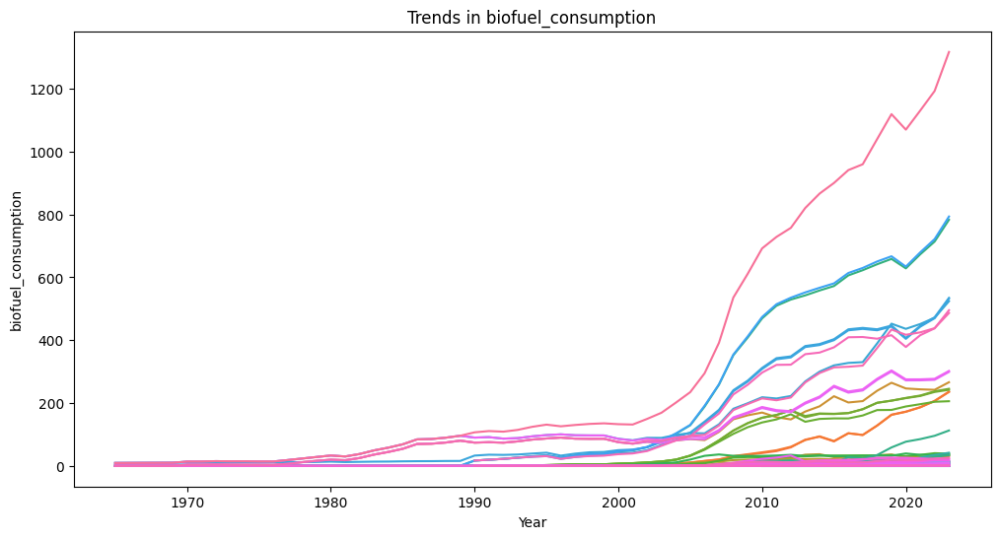

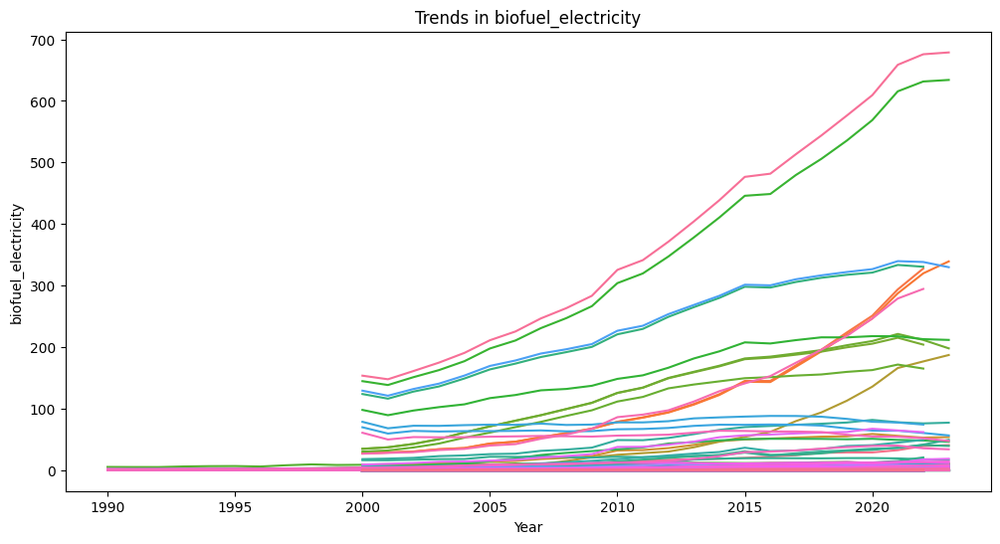

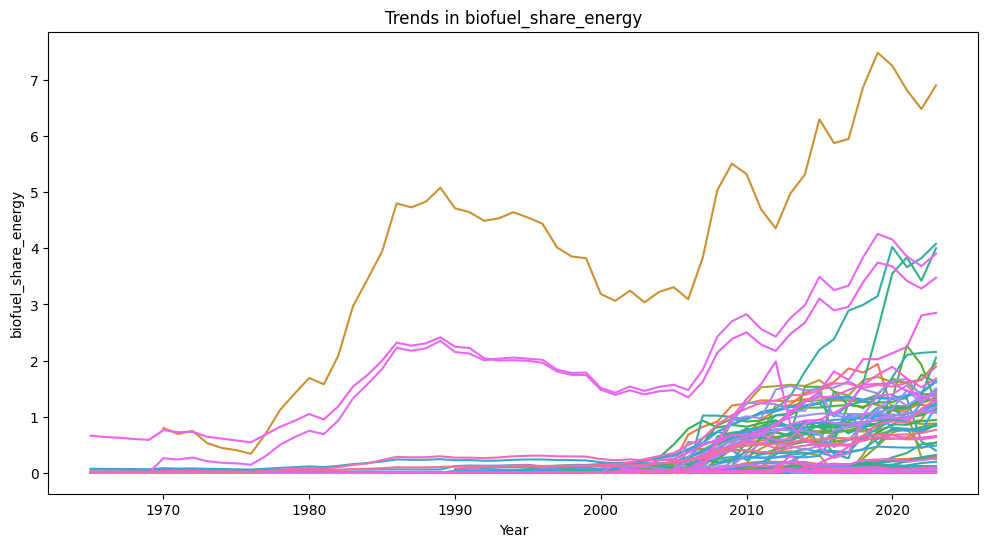

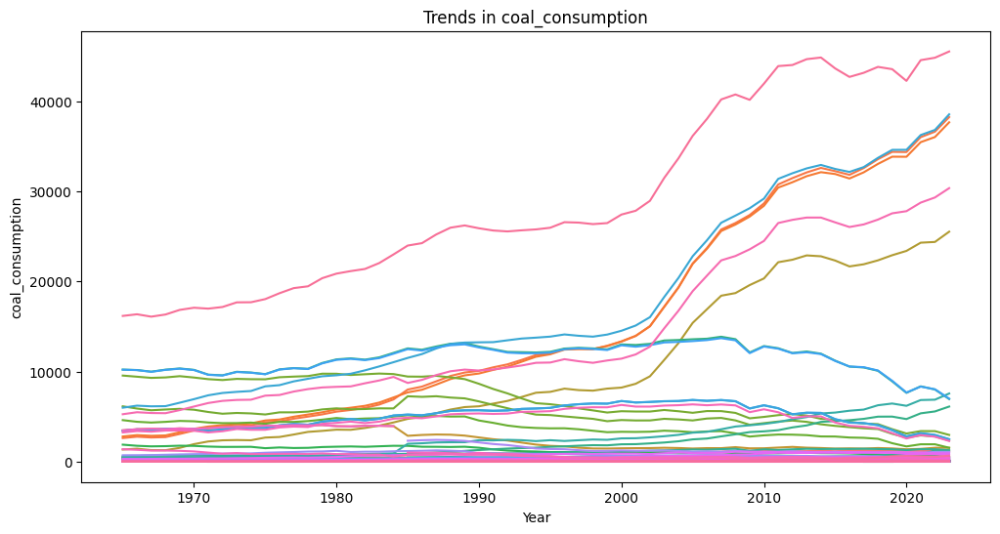

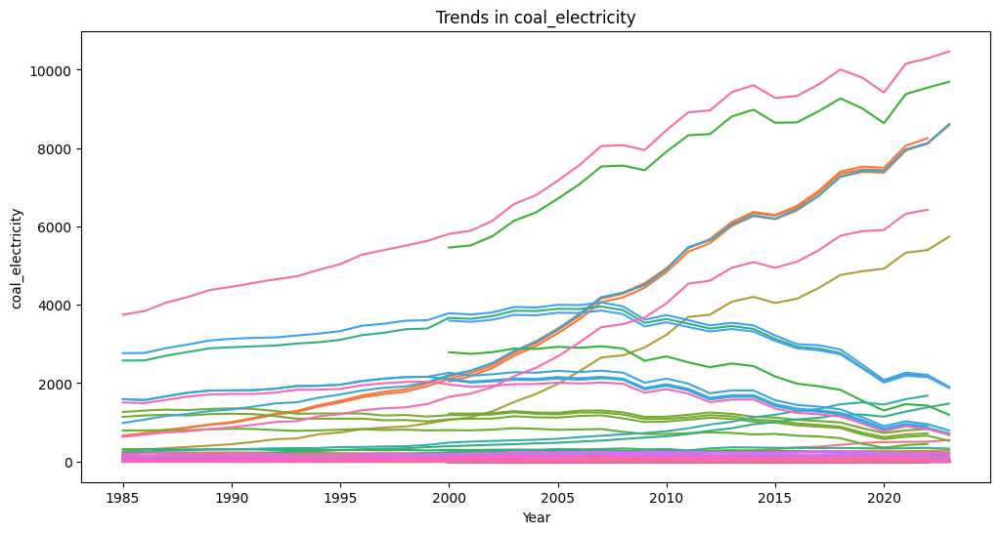

...

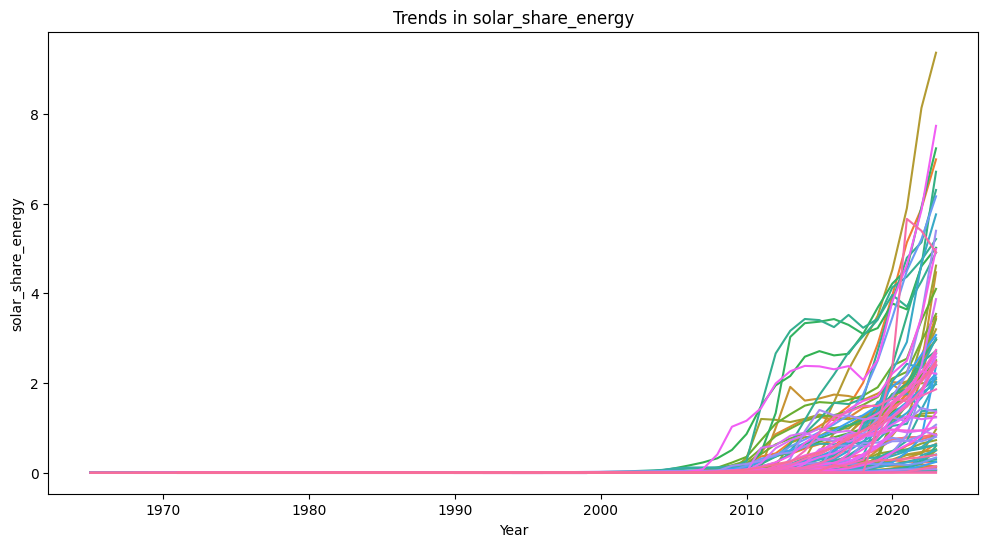

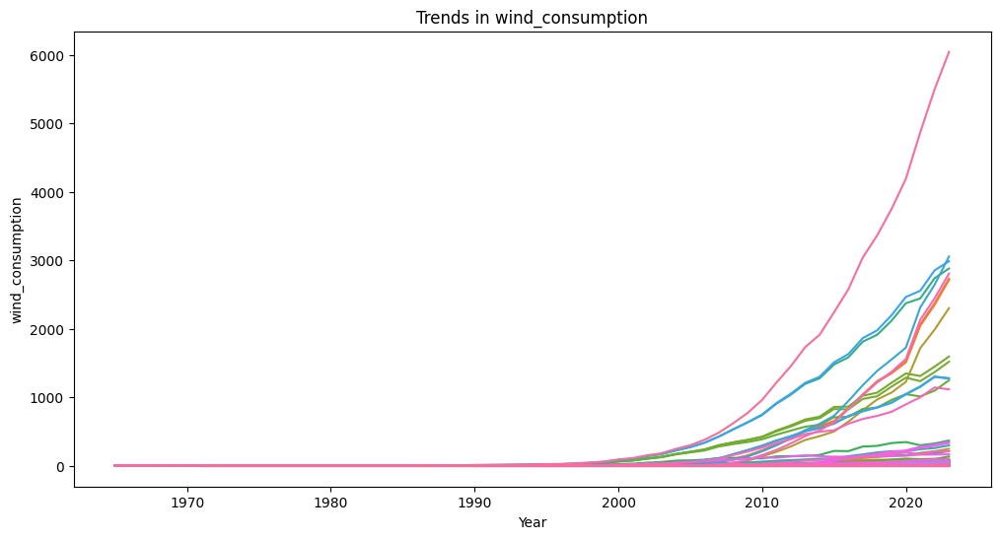

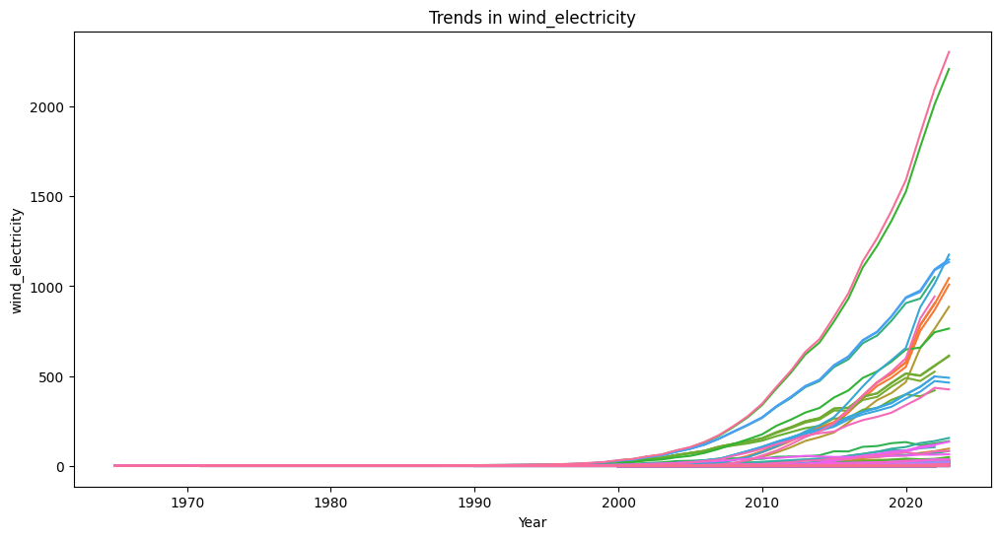

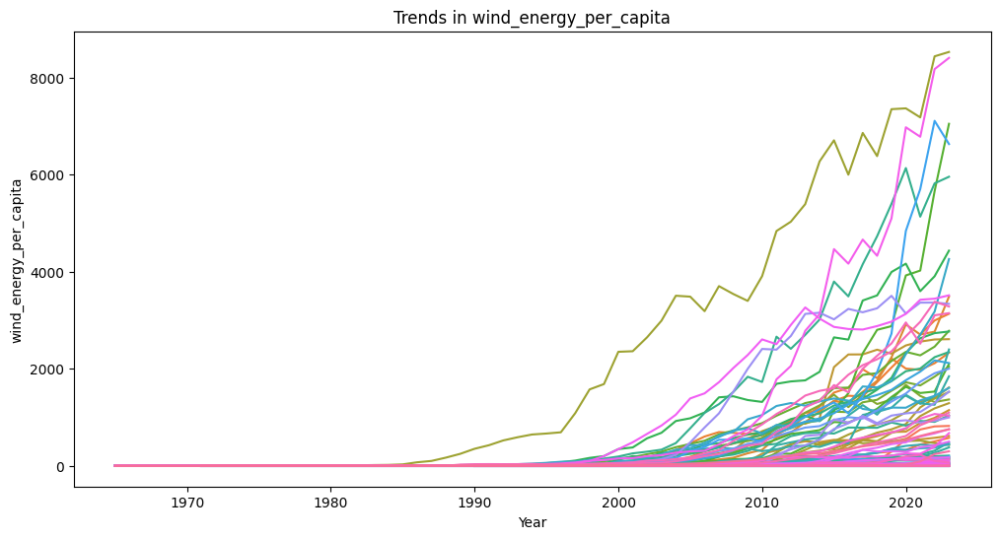

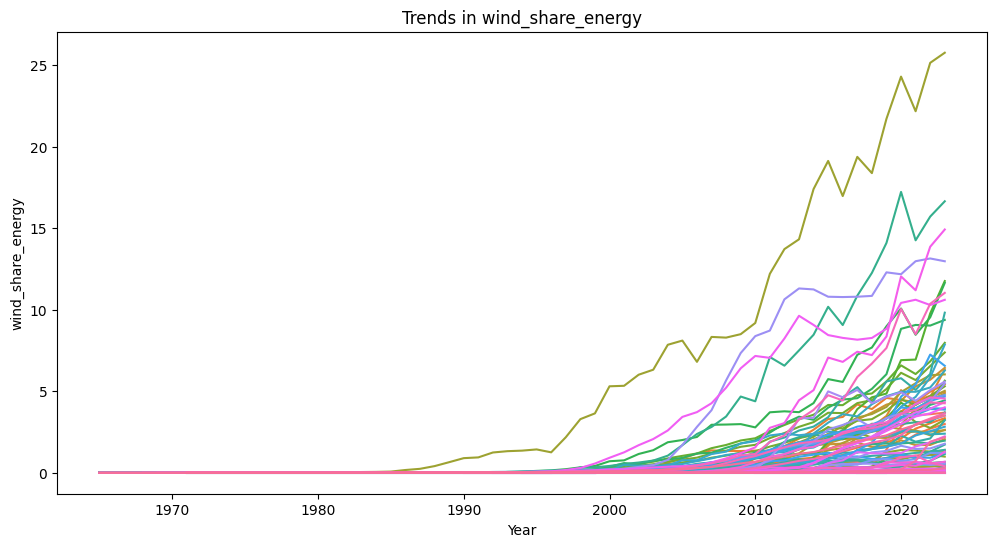

In [ ]:
for col in energy_columns:
    if owid_data[col].dtype in ['float64', 'int64']:
        plot_energy_trends(owid_data, col)
        

In [ ]:
def plot_energy_distribution(df, energy_source):
    """Plot distribution of energy production/consumption."""
    plt.figure(figsize=(12, 6))
    sns.histplot(df[energy_source], bins=30, kde=True)
    plt.title(f"Distribution of {energy_source}")
    plt.xlabel(energy_source)
    plt.ylabel("Frequency")
    plt.savefig(
        f"outputs/exploring_outputs/owid/figures/{energy_source}_distribution.png"
    )

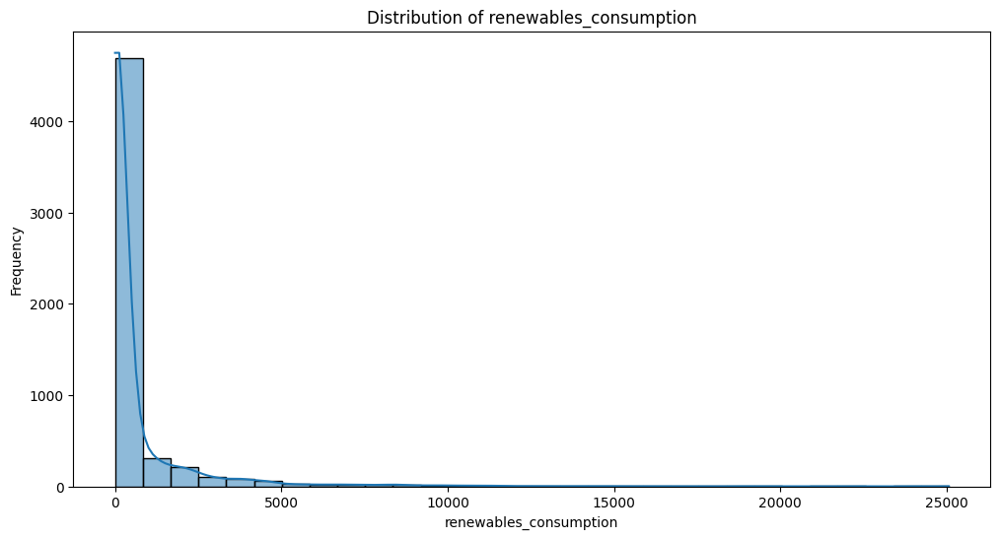

In [ ]:
plot_energy_distribution(owid_data, "renewables_consumption")

## 2. Dataset Group 2: Global Energy Consumption & Renewable Generation
- **renewablePowerGeneration97-17.csv:** Tracks renewable power generation trends from 1997 to 2017 across different energy types (hydro, wind, biofuel, solar, geothermal).

- **renewablesTotalPowerGeneration.csv:** Summarizes total renewable power generation in TWh globally.

- **nonRenewablesTotalPowerGeneration.csv:** Summarizes total non-renewable power generation in TWh globally.

- **top20CountriesPowerGeneration.csv:** Highlights the top 20 countries' renewable energy generation.

- **Country_Consumption_TWH.csv:** Records national energy consumption trends.

- **Continent_Consumption_TWH.csv:** Records energy consumption trends at a continental level.



## Dataset Group 3: Energy Generation & Consumption (from multiple sources)

- **HEATGEN_CLEANED.csv:** Contains cleaned data on heat generation. This dataset could be useful for understanding how different energy sources contribute to overall energy production.

- **ELECSTAT_CLEANED.csv:** Likely includes statistics on electricity consumption, possibly broken down by country and year.
- **RESHARE_CLEANED.csv:** Appears to contain information on the share of renewable energy sources in overall energy consumption.
- **PUBFIN_CLEANED.csv:** May provide financial data related to public investment in energy infrastructure.

# 2. Data Suitability for Forecasting and Visualization

Based on the project requirements, we can determine how each dataset fits into the forecasting and visualization strategy:

## A. Forecasting Future Renewable Energy Trends (5-10 years)

- **Suitable Datasets:**

    - owid-energy-data.csv (comprehensive energy trends over time)
    - renewablePowerGeneration97-17.csv (historical renewable energy production trends)
    - Country_Consumption_TWH.csv (energy consumption trends per country)
    - Continent_Consumption_TWH.csv (continental energy consumption)

- **Potential Models:**

    - ARIMA (for univariate time series forecasting)
    - Facebook Prophet (for trend prediction with seasonality)
    - LSTM (Long Short-Term Memory Networks) (for deep learning-based time series forecasting)

## B. Identifying Leading Countries in Renewable Energy Uptake

- **Suitable Datasets:**

    - top20CountriesPowerGeneration.csv (top renewable energy-producing countries)
    - RESHARE_CLEANED.csv (renewable share in total energy production)
    - Country_Consumption_TWH.csv (comparison of renewable vs. non-renewable consumption by country)

- **Visualization Strategy:**

    - Interactive heatmaps to show the most energy-progressive regions.
    - Bar charts comparing leading countries by energy type.

## C. Modeling Investment Impact on Renewable Energy
- **Suitable Datasets:**
    - PUBFIN_CLEANED.csv (public investment in energy)
    - owid-energy-data.csv (historical energy production and cost trends)
    - renewablePowerGeneration97-17.csv (historical changes in renewable adoption)
- **Approach:**

    - Regression models to assess the correlation between investments and energy growth.

## D. Evaluating Policy & Macroeconomic Factors
- **Suitable Datasets:**

    - owid-energy-data.csv (includes GDP, policy influences, and economic growth)
    - Country_Consumption_TWH.csv (energy needs per economy)
    - RESHARE_CLEANED.csv (renewable share impacted by policies)

- **Approach:**

    - Correlation analysis of GDP, policy initiatives, and renewable energy growth.

# E. Creating Interactive Visuals

- **Suitable Datasets:**

    - ELECSTAT_CLEANED.csv (electricity consumption trends)
    - owid-energy-data.csv (global insights)
    - renewablePowerGeneration97-17.csv (renewable breakdown)

- **Visualization Tools:**

    - Streamlit/Dash/Plotly for interactive graphs.
    - Choropleth Maps to showcase energy trends by region.
    - Time Series Line Charts for historical and forecasted trends.

electricity_consumption_statistics[]

In [40]:
electricity_consumption_statistics[electricity_consumption_statistics['Grid_Connection'] == 'State of Palestine (the)'].to_csv('outputs/exploring_outputs/IRR/State_of_Palestine.csv')
# electricity_consumption_statistics['Region_Tech_Desc'].value_counts()

In [29]:
owid_data[owid_data['country'] == 'Palestine'].to_csv('outputs/exploring_outputs/owid_palestine.csv')

# Store the jupyter notebook

In [ ]:
!jupyter nbconvert --to script "data_inspection.ipynb" --output-dir="outputs/scripts"
!jupyter nbconvert --to html "data_inspection.ipynb" --output-dir="outputs/html"

C:\Users\obada\AppData\Local\Programs\Python\Python313\Scripts\jupyter-nbconvert.EXE\__main__.py:4: DeprecationWarning: Parsing dates involving a day of month without a year specified is ambiguious
and fails to parse leap day. The default behavior will change in Python 3.15
to either always raise an exception or to use a different default year (TBD).
To avoid trouble, add a specific year to the input & format.
See https://github.com/python/cpython/issues/70647.
[NbConvertApp] Converting notebook data_inspection.ipynb to script
[NbConvertApp] Writing 14173 bytes to outputs\scripts\data_inspection.py
C:\Users\obada\AppData\Local\Programs\Python\Python313\Scripts\jupyter-nbconvert.EXE\__main__.py:4: DeprecationWarning: Parsing dates involving a day of month without a year specified is ambiguious
and fails to parse leap day. The default behavior will change in Python 3.15
to either always raise an exception or to use a different default year (TBD).
To avoid trouble, add a specific year to 